## TEST 

## DATA PREPROCESSING

In [16]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [17]:
test_df = pd.read_csv('test.csv')

In [18]:
test_df.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name
0,0013_01,Earth,True,G/3/S,TRAPPIST-1e,27.0,False,0.0,0.0,0.0,0.0,0.0,Nelly Carsoning
1,0018_01,Earth,False,F/4/S,TRAPPIST-1e,19.0,False,0.0,9.0,0.0,2823.0,0.0,Lerome Peckers
2,0019_01,Europa,True,C/0/S,55 Cancri e,31.0,False,0.0,0.0,0.0,0.0,0.0,Sabih Unhearfus
3,0021_01,Europa,False,C/1/S,TRAPPIST-1e,38.0,False,0.0,6652.0,0.0,181.0,585.0,Meratz Caltilter
4,0023_01,Earth,False,F/5/S,TRAPPIST-1e,20.0,False,10.0,0.0,635.0,0.0,0.0,Brence Harperez


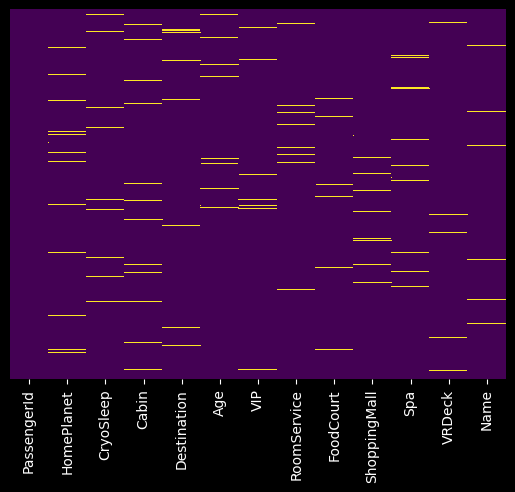

In [19]:
sns.heatmap(test_df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [20]:
sample_x = test_df.isnull().sum()

In [21]:
#TAKING CARE OF THE MISSING AND CATEGORICAL VALUES
#MEDIAN
test_df['Age']=test_df['Age'].fillna(test_df['Age'].median())

#MODE
test_df['HomePlanet']=test_df['HomePlanet'].fillna(test_df['HomePlanet'].mode()[0])
test_df['CryoSleep']=test_df['CryoSleep'].fillna(test_df['CryoSleep'].mode()[0])
test_df['Destination']=test_df['Destination'].fillna(test_df['Destination'].mode()[0])
test_df['RoomService']=test_df['RoomService'].fillna(test_df['RoomService'].mode()[0])
test_df['FoodCourt']=test_df['FoodCourt'].fillna(test_df['FoodCourt'].mode()[0])
test_df['ShoppingMall']=test_df['ShoppingMall'].fillna(test_df['ShoppingMall'].mode()[0])
test_df['Spa']=test_df['Spa'].fillna(test_df['Spa'].mode()[0])
test_df['VRDeck']=test_df['VRDeck'].fillna(test_df['VRDeck'].mode()[0])
test_df['VIP']=test_df['VIP'].fillna(test_df['VIP'].mode()[0])

#DROP
test_df.drop(['Cabin'],axis=1,inplace=True)
test_df.drop(['Name'],axis=1,inplace=True)
test_df.drop(['PassengerId'],axis=1,inplace=True)

In [22]:
test_df.head()

,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck
0,Earth,True,TRAPPIST-1e,27.0,False,0.0,0.0,0.0,0.0,0.0
1,Earth,False,TRAPPIST-1e,19.0,False,0.0,9.0,0.0,2823.0,0.0
2,Europa,True,55 Cancri e,31.0,False,0.0,0.0,0.0,0.0,0.0
3,Europa,False,TRAPPIST-1e,38.0,False,0.0,6652.0,0.0,181.0,585.0
4,Earth,False,TRAPPIST-1e,20.0,False,10.0,0.0,635.0,0.0,0.0


In [23]:
HomePlanet_dummies = pd.get_dummies(test_df['HomePlanet'],drop_first=True)
CryoSleep_dummies = pd.get_dummies(test_df['CryoSleep'],drop_first=True)
Destination_dummies = pd.get_dummies(test_df['Destination'],drop_first=True)
VIP_dummies = pd.get_dummies(test_df['VIP'],drop_first=True)

In [24]:
test_df.head()

,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck
0,Earth,True,TRAPPIST-1e,27.0,False,0.0,0.0,0.0,0.0,0.0
1,Earth,False,TRAPPIST-1e,19.0,False,0.0,9.0,0.0,2823.0,0.0
2,Europa,True,55 Cancri e,31.0,False,0.0,0.0,0.0,0.0,0.0
3,Europa,False,TRAPPIST-1e,38.0,False,0.0,6652.0,0.0,181.0,585.0
4,Earth,False,TRAPPIST-1e,20.0,False,10.0,0.0,635.0,0.0,0.0


In [25]:
test_df.drop(['HomePlanet','CryoSleep','Destination','VIP'],axis=1,inplace=True)

In [27]:
pd.concat([test_df,HomePlanet_dummies,CryoSleep_dummies,Destination_dummies,VIP_dummies],axis=1)

,Age,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Europa,Mars,True,PSO J318.5-22,TRAPPIST-1e,True
0,27.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,1,0
1,19.0,0.0,9.0,0.0,2823.0,0.0,0,0,0,0,1,0
2,31.0,0.0,0.0,0.0,0.0,0.0,1,0,1,0,0,0
3,38.0,0.0,6652.0,0.0,181.0,585.0,1,0,0,0,1,0
4,20.0,10.0,0.0,635.0,0.0,0.0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4272,34.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,1,0
4273,42.0,0.0,847.0,17.0,10.0,144.0,0,0,0,0,1,0
4274,26.0,0.0,0.0,0.0,0.0,0.0,0,1,1,0,0,0
4275,26.0,0.0,2680.0,0.0,0.0,523.0,1,0,0,0,1,0


In [28]:
test_df.isnull().sum()

Age             0
RoomService     0
FoodCourt       0
ShoppingMall    0
Spa             0
VRDeck          0
dtype: int64

In [29]:
test_df.to_csv('test_outcomes.csv',index=False)